# Simpsonの多様性指数に関するP値関数

* 黒木玄
* 2025-03-05

In [47]:
using Distributions
using LinearAlgebra
using Random
using StatsFuns
using StatsPlots
default(fmt=:png)

parameter_C(P) = dot(P, P)
parameter_T(P) = sum(p -> p^3, P)
simpson_diversity_index(P) = 1 - parameter_C(P)

unbiased_estimator_of_C(K) = (n = sum(K); (dot(K, K) - n)/ (n*(n-1)))
unbiased_estimator_of_T(K) = (n = sum(K); sum(k -> k*(k-1)*(k-2), K) / (n*(n-1)*(n-2)))
unbiased_estimator_of_sdi(K) = 1 - unbiased_estimator_of_C(K)

function _coefficients_abc(n)
    a = 4(n-2)/(n*(n-1))
    b = (4n-6)/(n*(n-1))
    c = 2/(n*(n-1))
    (; a, b, c)
end

function variane_of_unbiased_estimator_of_C(mult::Multinomial)
    n, P = params(mult)
    (; a, b, c) = _coefficients_abcfficients_abc(n)
    C = parameter_C(P)
    T = parameter_T(P)
    max(0, a*T - b*C^2 + c*C)
end
std_of_unbiased_estimator_of_C(mult::Multinomial) = √variane_of_unbiased_estimator_of_C(mult)

function varhat_sdihat_grundmann(K)
    n = sum(K)
    C̃ = dot(K, K) / n^2
    T̃ = sum(k -> k^3, K) / n^3
    4/n * (T̃ - C̃^2)
end
stdhat_sdihat_grundmann(K) = √max(0, varhat_sdihat_unbiased(K))

function varhat_sdihat_unbiased(K)
    n = sum(K)
    (; a, b, c) = _coefficients_abc(n)
    Ĉ = unbiased_estimator_of_C(K)
    T̂ = unbiased_estimator_of_T(K)
    (a*T̂ - b*Ĉ^2 + c*Ĉ) / (1-b)
end
stdhat_sdihat_unbiased(K) = √max(0, varhat_sdihat_unbiased(K))

function varhat_sdihat_plugin(K)
    n = sum(K)
    (; a, b, c) = _coefficients_abc(n)
    C̃ = dot(K, K) / n^2
    T̃ = sum(k -> k^3, K) / n^3
    max(0, a*T̃ - b*C̃^2 + c*C̃)
end
stdhat_sdihat_plugin(K) = √varhat_sdihat_plugin(K)

safediv(x, y) = x == 0 ? zero(x/y) : isinf(x) ? x*sign(y) : x/y

function pvalue_sdi_unbiased(K, sdi)
    sdihat = unbiased_estimator_of_sdi(K)
    sehat = stdhat_sdihat_unbiased(K)
    z = safediv(sdihat - sdi, sehat)
    2ccdf(Normal(), abs(z))
end

function pvalue_sdi_grundmann(K, sdi)
    sdihat = unbiased_estimator_of_sdi(K)
    sehat = stdhat_sdihat_grundmann(K)
    z = safediv(sdihat - sdi, sehat)
    2ccdf(Normal(), abs(z))
end

function pvalue_sdi_plugin(K, sdi)
    sdihat = unbiased_estimator_of_sdi(K)
    sehat = stdhat_sdihat_plugin(K)
    z = safediv(sdihat - sdi, sehat)
    2ccdf(Normal(), abs(z))
end

# Assume that dlink is the derivative of link.
function pvalue_sdi_linked(K, sdi; link=logit, dlink=x->1/x+1/(1-x))
    sdihat = unbiased_estimator_of_sdi(K)
    sehat = stdhat_sdihat_plugin(K)
    Δsdi_linked = link(sdihat) - link(sdi)
    sehat_linked = abs(dlink(sdihat)) * sehat
    z = safediv(Δsdi_linked, sehat_linked)
    2ccdf(Normal(), abs(z))
end

function sim_pval(mult::Multinomial;
        sdi₀ = simpson_diversity_index(probs(mult)),
        niters = 10^5,
    )
    pval_grundmann = zeros(niters)
    pval_unbiased = zeros(niters)
    pval_plugin = zeros(niters)
    pval_linked = zeros(niters)
    Ktmp = [rand(mult) for _ in 1:Threads.nthreads()]
    Threads.@threads :static for i in 1:niters
        tid = Threads.threadid()
        K = rand!(mult, Ktmp[tid])
        pval_grundmann[i] = pvalue_sdi_grundmann(K, sdi₀)
        pval_unbiased[i] = pvalue_sdi_unbiased(K, sdi₀)
        pval_plugin[i] = pvalue_sdi_plugin(K, sdi₀)
        pval_linked[i] = pvalue_sdi_linked(K, sdi₀)
    end
    (; pval_grundmann, pval_unbiased, pval_plugin, pval_linked)
end

_ecdf(A, x) = count(≤(x), A) / length(A)

function plot_sim_pval(mult::Multinomial;
        sdi₀ = simpson_diversity_index(probs(mult)),
        niters = 10^5,
    )
    (; pval_grundmann, pval_unbiased, pval_plugin, pval_linked) = sim_pval(mult; sdi₀, niters)
    plot()
    plot!(sdi -> _ecdf(pval_linked, sdi), 0, 0.1; label="logit")
    plot!(sdi -> _ecdf(pval_plugin, sdi), 0, 0.1; label="plugin", ls=:dash)
    plot!(sdi -> _ecdf(pval_unbiased, sdi), 0, 0.1; label="unbiased", ls=:dashdot)
    plot!(sdi -> _ecdf(pval_grundmann, sdi), 0, 0.1; label="grundmann", ls=:dashdotdot)
    plot!(identity; label="", ls=:dot, c=:gray)
    plot!(size = (400, 400))
end

multinomial(K) = Multinomial(sum(K), K/sum(K))

multinomial (generic function with 1 method)

sdihat = unbiased_estimator_of_sdi(K) = 0.8
sehat_grundmann = stdhat_sdihat_unbiased(K) = 0.0
sehat_unbiased = stdhat_sdihat_unbiased(K) = 0.0
sehat_plugin = stdhat_sdihat_plugin(K) = 0.03952847075210474

sdihat = unbiased_estimator_of_sdi(K) = 0.7833333333333333
sehat_grundmann = stdhat_sdihat_unbiased(K) = 0.0
sehat_unbiased = stdhat_sdihat_unbiased(K) = 0.0
sehat_plugin = stdhat_sdihat_plugin(K) = 0.04980021936656839

sdihat = unbiased_estimator_of_sdi(K) = 0.7777777777777778
sehat_grundmann = stdhat_sdihat_unbiased(K) = 0.0
sehat_unbiased = stdhat_sdihat_unbiased(K) = 0.0
sehat_plugin = stdhat_sdihat_plugin(K) = 0.045071758350266174

sdihat = unbiased_estimator_of_sdi(K) = 0.4285714285714286
sehat_grundmann = stdhat_sdihat_unbiased(K) = 0.20203050891044225
sehat_unbiased = stdhat_sdihat_unbiased(K) = 0.20203050891044225
sehat_plugin = stdhat_sdihat_plugin(K) = 0.16870038953295696

sdihat = unbiased_estimator_of_sdi(K) = 0.4
sehat_grundmann = stdhat_sdihat_unbiased(K) = 0.1222499691

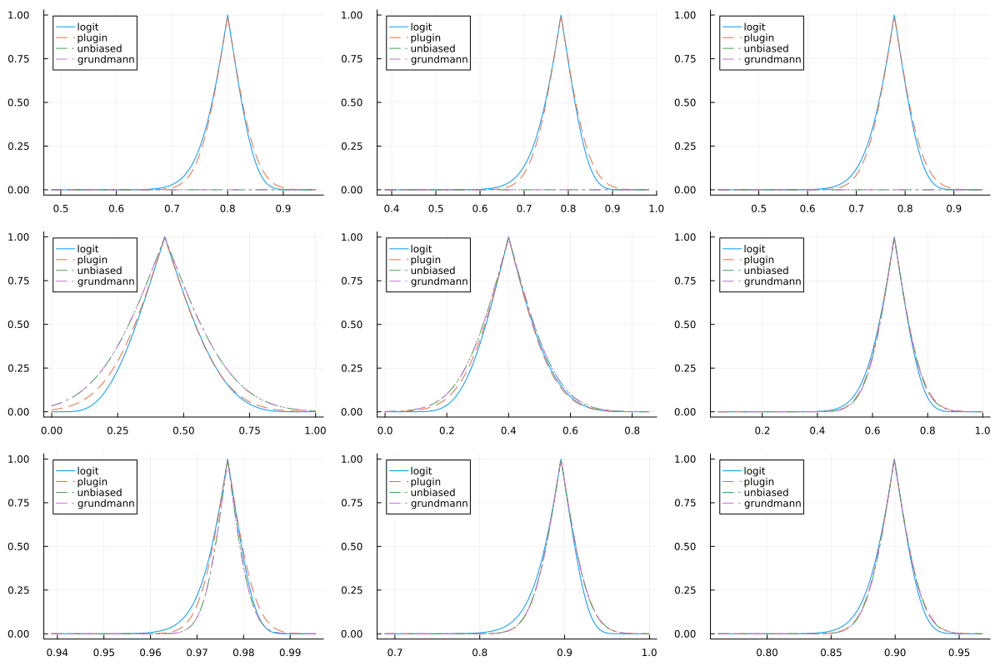

In [45]:
data1 = [4, 4, 4, 4]
data2 = [5, 5, 3, 3]
data3 = [6, 5, 4, 3]
data4 = [6, 2]
data5 = [12, 4]
data6 = [10, 6, 2, 1, 1]
table1 = [9; 8; 7; 6; 5; 5; fill(4, 3); fill(3, 4); fill(2, 9); fill(1, 35)]
table2 = [37; 5; fill(4, 2); fill(3, 4); fill(2, 8); fill(1, 39)]
table3 = [30; 13; 9; 8; fill(7, 3); fill(6, 2); 5; fill(2, 3); fill(1, 13)]

datasets = [data1, data2, data3, data4, data5, data6, table1, table2, table3]

PP = []
for K in datasets
    @show sdihat = unbiased_estimator_of_sdi(K)
    @show sehat_grundmann = stdhat_sdihat_unbiased(K)
    @show sehat_unbiased = stdhat_sdihat_unbiased(K)
    @show sehat_plugin = stdhat_sdihat_plugin(K)
    println()
    sehat = sehat_plugin
    if sehat == 0
        sdimin, sdimax = 0, 1
    else
        sdimin, sdimax = max(0, sdihat-8sehat), min(1, sdihat+4sehat)
    end
    P = plot()
    plot!(sdi -> pvalue_sdi_linked(K, sdi), sdimin, sdimax; label="logit")
    plot!(sdi -> pvalue_sdi_plugin(K, sdi), sdimin, sdimax; label="plugin", ls=:dash)
    plot!(sdi -> pvalue_sdi_unbiased(K, sdi), sdimin, sdimax; label="unbiased", ls=:dashdot)
    plot!(sdi -> pvalue_sdi_grundmann(K, sdi), sdimin, sdimax; label="grundmann", ls=:dashdotdot)
    push!(PP, P)
end

plot!(PP...; size=(1200, 800), layout=(3, 3), legend=:topleft)

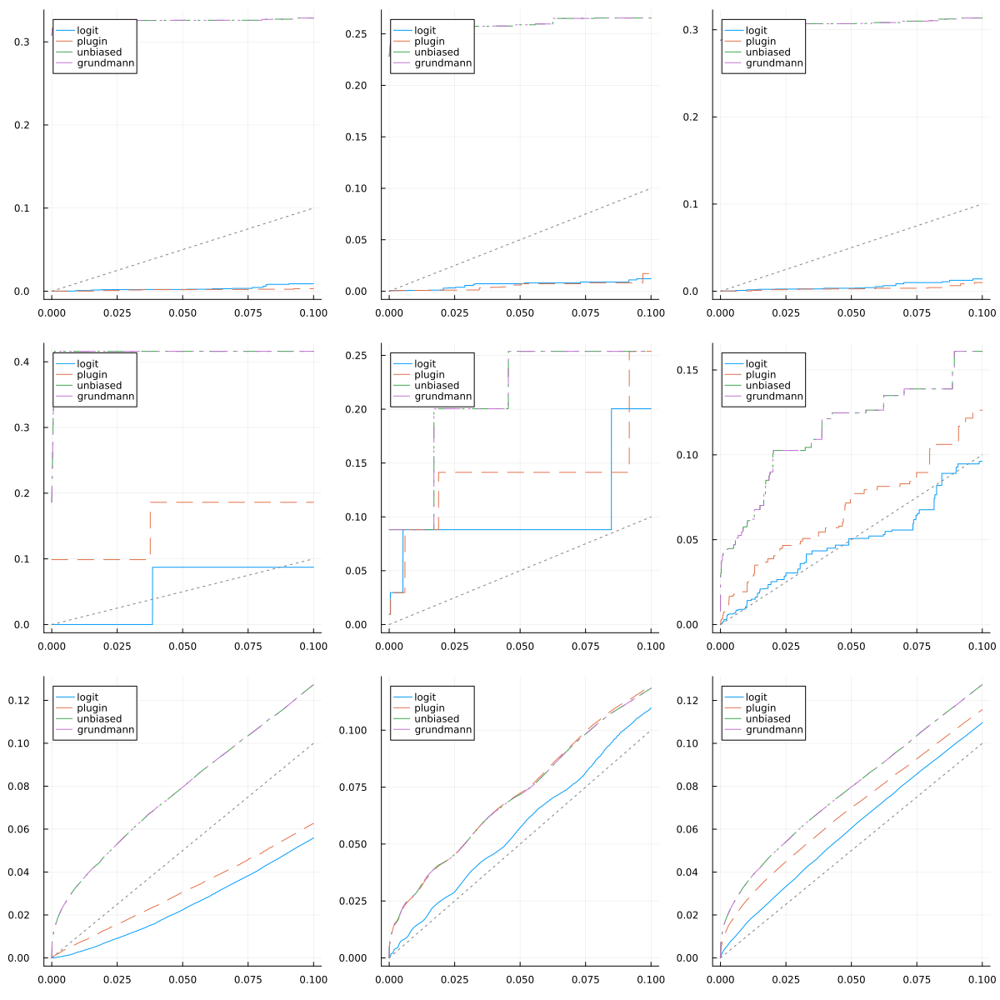

In [48]:
data1 = [4, 4, 4, 4]
data2 = [5, 5, 3, 3]
data3 = [6, 5, 4, 3]
data4 = [6, 2]
data5 = [12, 4]
data6 = [10, 6, 2, 1, 1]
table1 = [9; 8; 7; 6; 5; 5; fill(4, 3); fill(3, 4); fill(2, 9); fill(1, 35)]
table2 = [37; 5; fill(4, 2); fill(3, 4); fill(2, 8); fill(1, 39)]
table3 = [30; 13; 9; 8; fill(7, 3); fill(6, 2); 5; fill(2, 3); fill(1, 13)]

datasets = [data1, data2, data3, data4, data5, data6, table1, table2, table3]

PP = []
for K in datasets
    P = plot_sim_pval(multinomial(K))
    push!(PP, P)
end

plot!(PP...; size=(1200, 1200), layout=(3, 3), legend=:topleft)

round.(P; sigdigits = 2) = [0.43, 0.11, 0.11, 0.1, 0.067, 0.054, 0.051, 0.037, 0.029, 0.0081, 0.0036, 0.0022, 0.00033, 0.00025, 0.00022, 8.5e-5, 5.6e-5, 3.3e-5, 1.4e-5, 1.1e-5, 3.2e-6, 2.0e-6, 9.3e-7, 4.5e-7, 3.0e-7, 2.0e-7, 1.5e-7, 1.3e-7, 4.4e-8, 3.7e-8, 3.4e-8, 1.4e-8, 6.4e-9, 3.8e-10, 3.6e-10, 2.6e-10, 1.6e-10, 3.5e-11, 9.8e-12, 5.9e-12, 1.1e-12, 6.4e-13, 1.3e-14, 1.4e-16, 5.3e-17, 2.8e-17, 3.4e-18, 1.4e-26, 3.9e-30, 9.100000000000001e-33]
simpson_diversity_index(P) = 0.7687998677648258
  0.017863 seconds (330.68 k allocations: 6.501 MiB, 20.34% gc time)


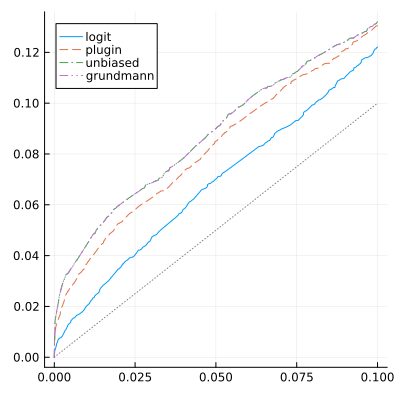

In [50]:
n = 50
P = sort(rand(Dirichlet(fill(0.05, 50))); rev=true)
P = P/sum(P)
@show round.(P; sigdigits=2)
@show simpson_diversity_index(P)
mult = Multinomial(n, P)
@time plot_sim_pval(mult; niters=10^4)

round.(P; sigdigits = 2) = [0.55, 0.14, 0.11, 0.093, 0.049, 0.03, 0.0087, 0.004, 0.0033, 0.0032, 0.0022, 0.0017, 0.00071, 0.00038, 6.3e-5, 5.0e-5, 2.0e-5, 1.5e-5, 2.6e-6, 1.8e-6, 1.4e-6, 1.3e-6, 7.5e-7, 7.4e-7, 7.4e-7, 2.4e-7, 3.6e-9, 2.6e-9, 1.9e-9, 1.5e-9, 9.9e-10, 4.0e-10, 9.6e-11, 8.9e-12, 6.1e-12, 5.5e-12, 2.1e-12, 6.7e-13, 4.3e-15, 8.4e-16, 7.0e-16, 1.0e-16, 4.7e-18, 1.5e-19, 7.7e-21, 2.3e-21, 4.1000000000000004e-22, 1.0999999999999998e-24, 7.2e-26, 1.2e-27]
simpson_diversity_index(P) = 0.6511854136653583
  0.025735 seconds (496.92 k allocations: 9.612 MiB, 13.53% gc time)


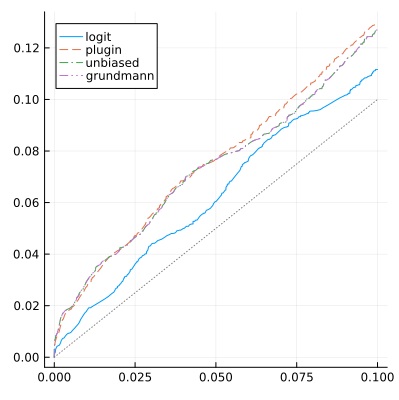

In [51]:
n = 50
P = [0.55, 0.14, 0.11, 0.093, 0.049, 0.03, 0.0087, 0.004, 0.0033, 0.0032, 0.0022, 0.0017, 0.00071, 0.00038, 6.3e-5, 5.0e-5, 2.0e-5, 1.5e-5, 2.6e-6, 1.8e-6, 1.4e-6, 1.3e-6, 7.5e-7, 7.4e-7, 7.4e-7, 2.4e-7, 3.6e-9, 2.6e-9, 1.9e-9, 1.5e-9, 9.9e-10, 4.0e-10, 9.6e-11, 8.9e-12, 6.1e-12, 5.5e-12, 2.1e-12, 6.7e-13, 4.3e-15, 8.4e-16, 7.0e-16, 1.0e-16, 4.7e-18, 1.5e-19, 7.7e-21, 2.3e-21, 4.1000000000000004e-22, 1.0999999999999998e-24, 7.2e-26, 1.2e-27]
P = P/sum(P)
@show round.(P; sigdigits=2)
@show simpson_diversity_index(P)
mult = Multinomial(n, P)
@time plot_sim_pval(mult; niters=10^4)

round.(P; sigdigits = 2) = [0.4, 0.19, 0.18, 0.091, 0.052, 0.033, 0.013, 0.011, 0.0095, 0.0077, 0.0063, 0.0038, 0.0021, 0.0013, 0.001, 0.00059, 0.00042, 0.00018, 2.6e-5, 2.4e-5, 2.9e-6, 7.7e-7, 3.3e-7, 1.3e-7, 1.2e-7, 1.2e-7, 7.5e-8, 5.3e-8, 3.9e-8, 3.5e-8, 2.3e-8, 1.2e-8, 1.0e-8, 8.0e-9, 7.0e-9, 6.1e-9, 1.6e-9, 1.4e-9, 5.0e-10, 1.3e-10, 3.0e-11, 1.3e-13, 2.0e-14, 9.5e-15, 1.4e-15, 3.7e-16, 1.6e-16, 3.7e-17, 1.9e-21, 1.2000000000000001e-30]
simpson_diversity_index(P) = 0.7603381862959666
  0.015774 seconds (281.38 k allocations: 5.607 MiB, 12.91% gc time)


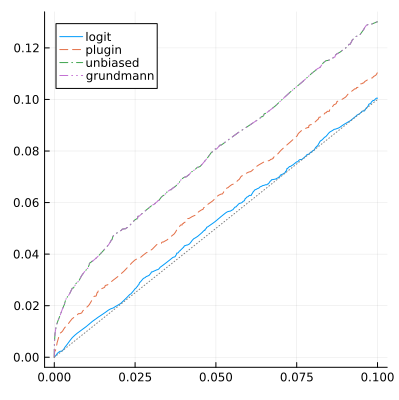

In [52]:
n = 50
P = [0.4, 0.19, 0.18, 0.091, 0.052, 0.033, 0.013, 0.011, 0.0095, 0.0077, 0.0063, 0.0038, 0.0021, 0.0013, 0.001, 0.00059, 0.00042, 0.00018, 2.6e-5, 2.4e-5, 2.9e-6, 7.7e-7, 3.3e-7, 1.3e-7, 1.2e-7, 1.2e-7, 7.5e-8, 5.3e-8, 3.9e-8, 3.5e-8, 2.3e-8, 1.2e-8, 1.0e-8, 8.0e-9, 7.0e-9, 6.1e-9, 1.6e-9, 1.4e-9, 5.0e-10, 1.3e-10, 3.0e-11, 1.3e-13, 2.0e-14, 9.5e-15, 1.4e-15, 3.7e-16, 1.6e-16, 3.7e-17, 1.9e-21, 1.2000000000000001e-30]
P = P/sum(P)
@show round.(P; sigdigits=2)
@show simpson_diversity_index(P)
mult = Multinomial(n, P)
@time plot_sim_pval(mult; niters=10^4)

round.(P; sigdigits = 2) = [0.48, 0.14, 0.12, 0.08, 0.045, 0.032, 0.022, 0.021, 0.019, 0.0094, 0.0088, 0.0084, 0.0027, 0.0018, 0.0012, 0.0007, 0.00067, 0.00064, 0.00062, 0.0002, 0.00015, 0.00013, 0.0001, 6.3e-5, 4.0e-5, 3.9e-5, 2.5e-5, 1.8e-5, 1.6e-5, 1.3e-5, 6.6e-6, 2.5e-6, 1.0e-6, 4.1e-7, 3.5e-7, 3.1e-7, 1.5e-7, 8.7e-8, 7.4e-8, 2.0e-8, 5.9e-9, 2.6e-9, 5.5e-10, 6.4e-11, 2.3e-11, 8.5e-12, 5.0e-14, 2.2e-20, 6.7e-23, 1.2e-26]
simpson_diversity_index(P) = 0.7216381815096633
  0.011957 seconds (245.27 k allocations: 4.938 MiB)


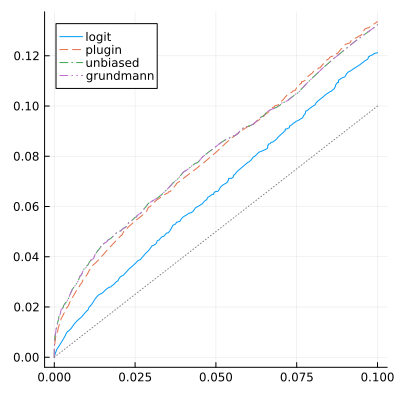

In [53]:
n = 50
P = [0.48, 0.14, 0.12, 0.08, 0.045, 0.032, 0.022, 0.021, 0.019, 0.0093, 0.0088, 0.0084, 0.0027, 0.0018, 0.0012, 0.0007, 0.00067, 0.00064, 0.00062, 0.0002, 0.00015, 0.00013, 0.0001, 6.3e-5, 4.0e-5, 3.9e-5, 2.5e-5, 1.8e-5, 1.6e-5, 1.3e-5, 6.6e-6, 2.5e-6, 1.0e-6, 4.1e-7, 3.5e-7, 3.1e-7, 1.5e-7, 8.7e-8, 7.4e-8, 2.0e-8, 5.9e-9, 2.6e-9, 5.5e-10, 6.4e-11, 2.3e-11, 8.5e-12, 5.0e-14, 2.2e-20, 6.7e-23, 1.2e-26]
P = P/sum(P)
@show round.(P; sigdigits=2)
@show simpson_diversity_index(P)
mult = Multinomial(n, P)
@time plot_sim_pval(mult; niters=10^4)

In [71]:
function sims_alpha_error_rate(;
        n = 10,
        dirich = Dirichlet(fill(0.05, 100)),
        nsims = 200,
        α = 0.05,
        niters = 10^4,
        f = Bool[1,1,1,1],
    )
    aer_grundmann = zeros(nsims)
    aer_unbiased = zeros(nsims)
    aer_plugin = zeros(nsims)
    aer_linked = zeros(nsims)
    for i in 1:nsims
        P = sort(rand(dirich); rev=true)
        mult = Multinomial(n, P)
        (; pval_grundmann, pval_unbiased, pval_plugin, pval_linked) = sim_pval(mult; niters)
        aer_grundmann[i] = _ecdf(pval_grundmann, α)
        aer_unbiased[i] = _ecdf(pval_unbiased, α)
        aer_plugin[i] = _ecdf(pval_plugin, α)
        aer_linked[i] = _ecdf(pval_linked, α)
    end

    plot()
    f[1] && scatter!(1:nsims, aer_linked; label="logit", msc=:auto, ms=2, alpha=0.7, c=1)
    f[2] && scatter!(1:nsims, aer_plugin; label="plugin", msc=:auto, ms=2, alpha=0.7, c=2)
    f[3] && scatter!(1:nsims, aer_unbiased; label="unbiased", msc=:auto, ms=2, alpha=0.7, c=3)
    f[4] && scatter!(1:nsims, aer_grundmann; label="grundmann", msc=:auto, ms=2, alpha=0.7, c=4)
    f[1] && hline!([mean(aer_linked)]; label="", ls=:dot, lw=1.5, c=1)
    f[2] && hline!([mean(aer_plugin)]; label="", ls=:dash, c=2)
    f[3] && hline!([mean(aer_unbiased)]; label="", ls=:dashdot, c=3)
    f[4] && hline!([mean(aer_grundmann)]; label="", ls=:dashdotdot, c=4)
    hline!([α]; label="", ls=:dash, c=:black)
    plot!(ytick=0:0.01:1)
    title!("n = $n")
end

sims_alpha_error_rate (generic function with 1 method)

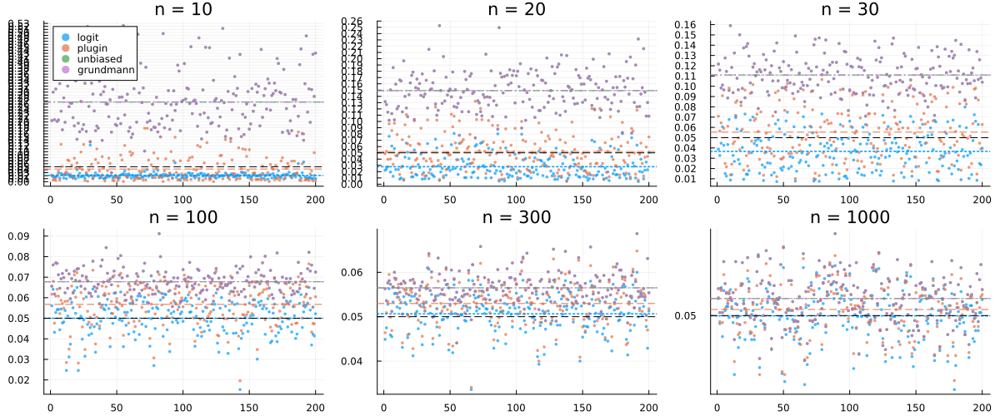

In [72]:
PP = []
for n in (10, 20, 30, 100, 300, 1000)
    P = sims_alpha_error_rate(; n)
    n != 10 && plot!(legend=false)
    push!(PP, P)
end
plot(PP...; size=(1200, 500), layout=(2, 3))

In [92]:
function plot_sims_alpha_error_rate(;
        r = 10,
        n = 10,
    )
    PP = []
    for κ in (0.02, 0.05, 0.1, 0.2, 0.5, 1.0)
        dirich = Dirichlet(fill(κ, r))
        P = sims_alpha_error_rate(; n, dirich, f=Bool[1,1,0,0])
        n != 10 && plot!(legend=false)
        title!("(κ, r)=($κ, $r), n=$n")
        push!(PP, P)
    end
    plot(PP...; size=(1200, 600), layout=(2, 3))
end

plot_sims_alpha_error_rate (generic function with 1 method)

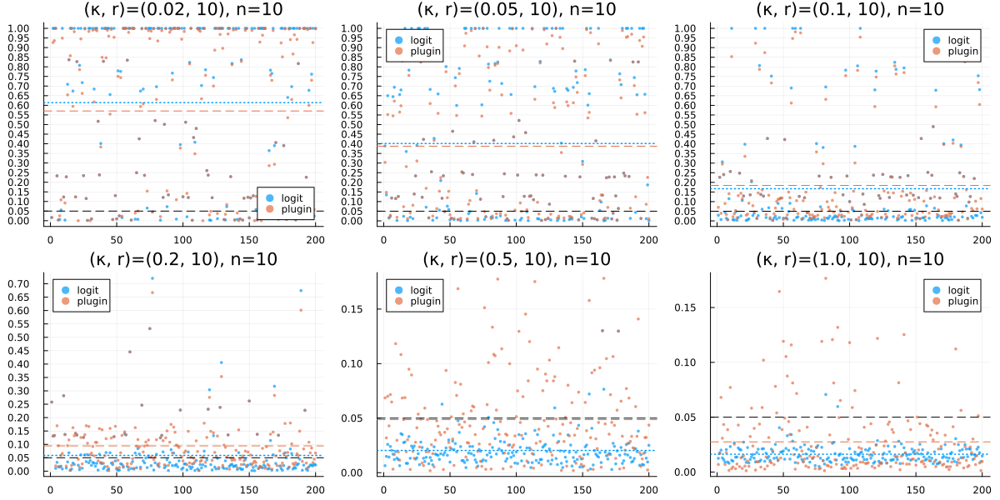

In [93]:
plot_sims_alpha_error_rate(; r=10, n=10)
plot!(ytick=0:0.05:1)

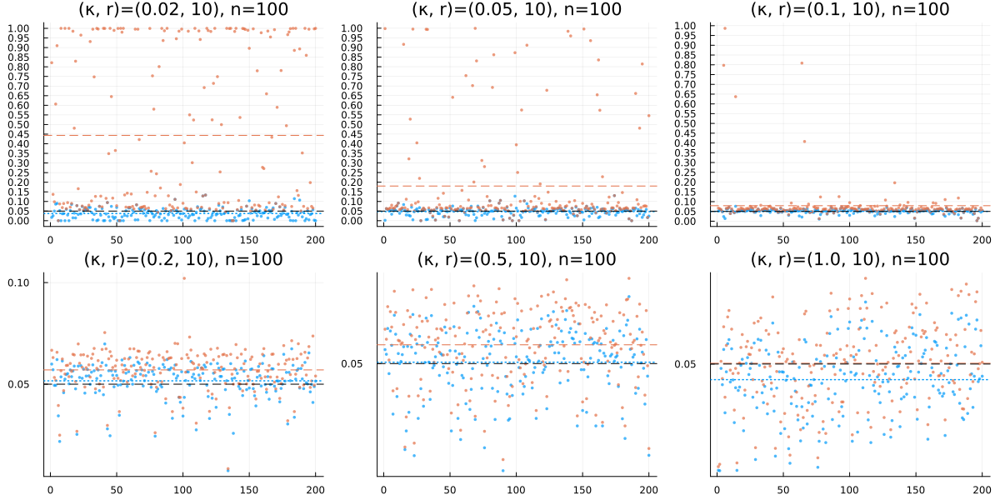

In [97]:
plot_sims_alpha_error_rate(; r=10, n=100)
plot!(ytick=0:0.05:1)

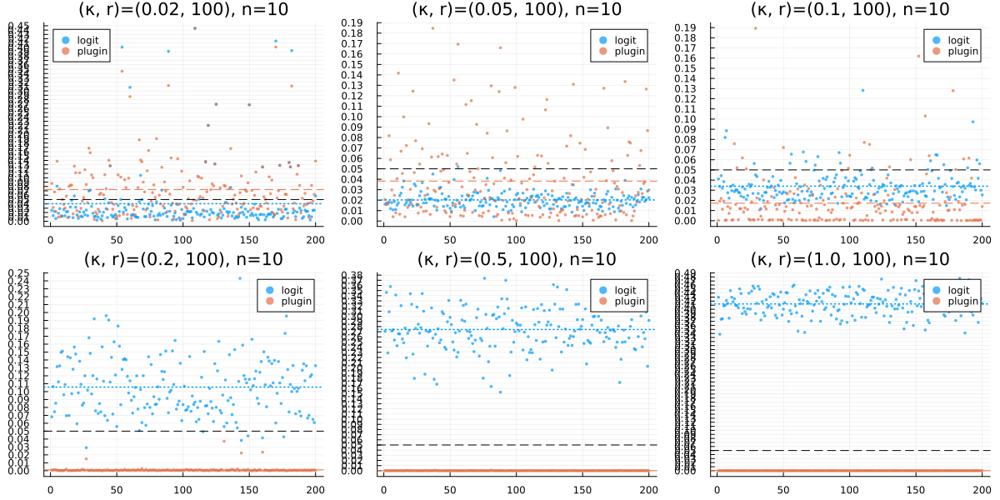

In [94]:
plot_sims_alpha_error_rate(; r=100, n=10)

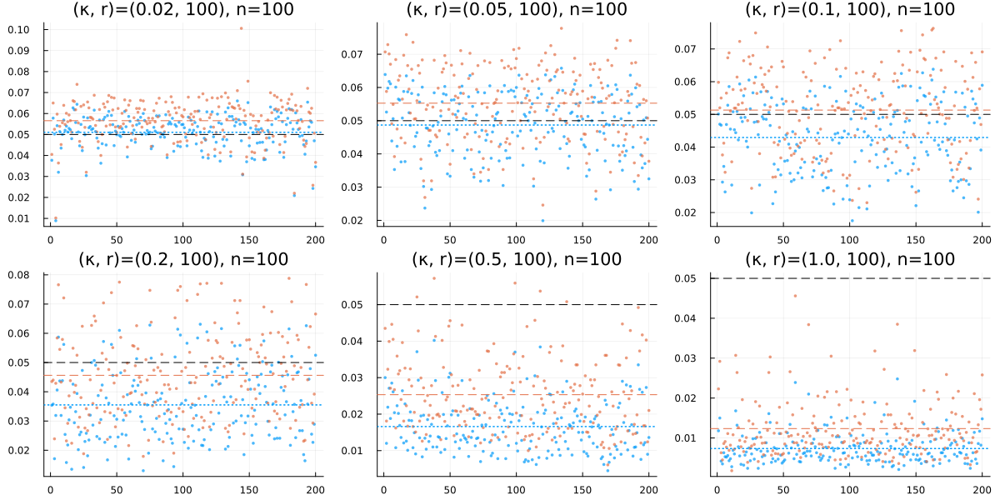

In [95]:
plot_sims_alpha_error_rate(; r=100, n=100)

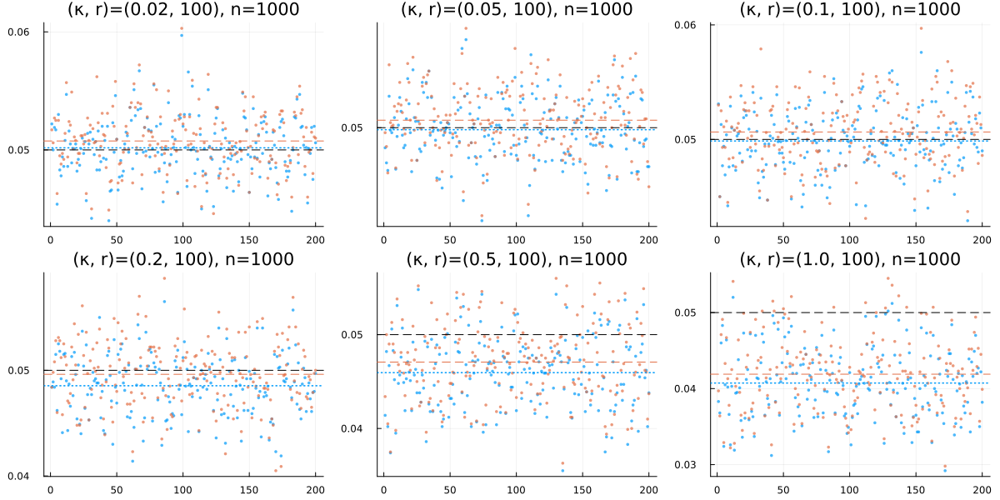

In [96]:
plot_sims_alpha_error_rate(; r=100, n=1000)

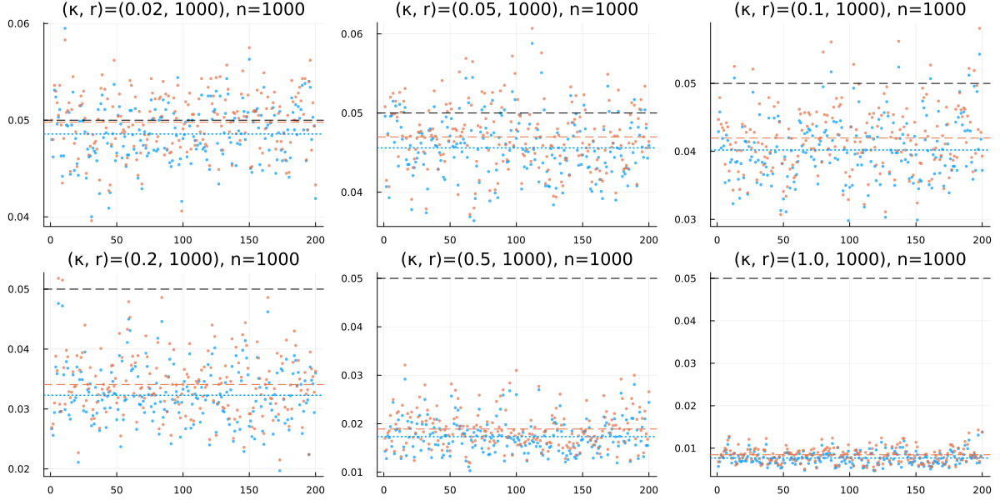

In [98]:
plot_sims_alpha_error_rate(; r=1000, n=1000)